In [2]:
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
%matplotlib inline

In [159]:
def camera_calibration():
    objpoints = []
    imgpoints = []
    objp = np.zeros((6*9,3),np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    url = 'CarND-Advanced-Lane-Lines/camera_cal/'
    name = 'calibration*.jpg'
    images = glob.glob(url+name)
    for image in images:
        img = cv2.imread(image)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    return mtx, dist

In [171]:
mtx, dist = camera_calibration()
def undist (img):
    return cv2.undistort(img, mtx, dist, None, mtx)

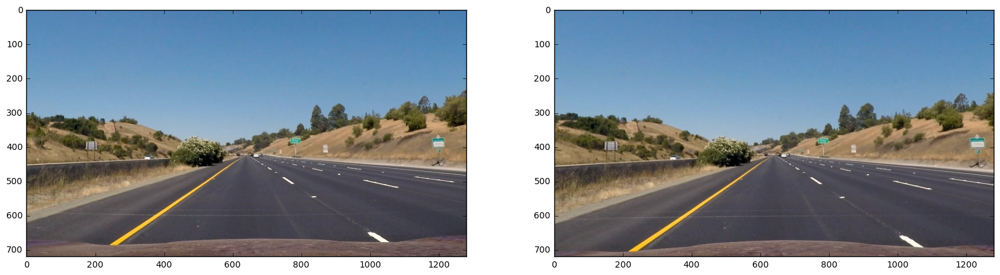

In [172]:
#fname = 'CarND-Advanced-Lane-Lines/camera_cal/calibration5.jpg'
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
dst = undist(img)
f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
ax1.imshow(img)
ax2.imshow(dst)

In [174]:
# quiz
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in an image
img = cv2.imread('test_image2.png')
nx = 8 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    und_img = cv2.undistort(img, mtx, dist, None, mtx)
    # 2) Convert to grayscale
    gray = cv2.cvtColor(und_img,cv2.COLOR_BGR2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)
    if ret:
    # 4) If corners found: 
            # a) draw corners
        und_img = cv2.drawChessboardCorners(und_img,(nx,ny),corners,ret)
            # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
        #print (len(corners[0][0]))
        src = np.zeros((4,2),np.float32)
        src[0] = corners[0]
        src[1] = corners[nx-1]
        src[2] = corners[-1]
        src[3] = corners[-nx]
                 #Note: you could pick any four of the detected corners 
                 # as long as those four corners define a rectangle
                 #One especially smart way to do this would be to use four well-chosen
                 # corners that were automatically detected during the undistortion steps
                 #We recommend using the automatic detection of corners in your code
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        
        img_size = (img.shape[1], img.shape[0])
        shape = img_size[0]/8
        dst = np.float32([[shape/2,shape/2],[img_size[0]-shape/2,shape/2],[img_size[0]-shape/2,img_size[1]-shape/2],[shape/2,img_size[1]-shape/2]])
        
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src,dst)
            # e) use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(und_img, M, img_size, flags=cv2.INTER_LINEAR)
    #delete the next two lines
    
    return warped, M

top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

FileNotFoundError: [Errno 2] No such file or directory: 'wide_dist_pickle.p'

In [6]:
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines1.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)

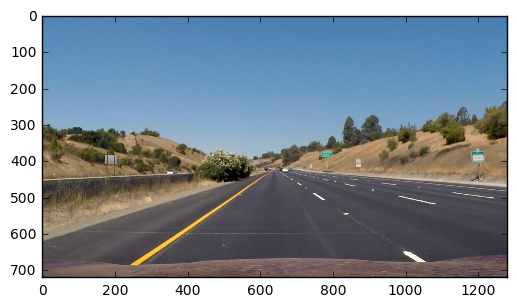

In [7]:
#%matplotlib qt
plt.imshow(img)

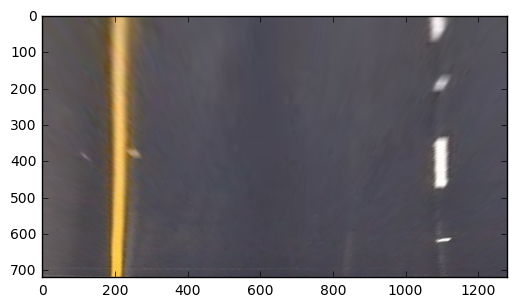

In [8]:
%matplotlib inline
img_size = (img.shape[1], img.shape[0])
src = np.float32([
[378,600],
[574,464],
[709,464],
[916,600]])
dst = np.float32([[200,img_size[1]],[200,0],[1100,0],[1100,img_size[1]]])
M = cv2.getPerspectiveTransform(src,dst)
warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
plt.imshow(warp)

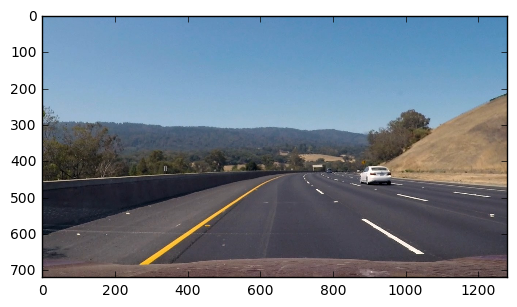

In [9]:
# Sobel Operator
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test3.jpg'
img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
plt.imshow(img)

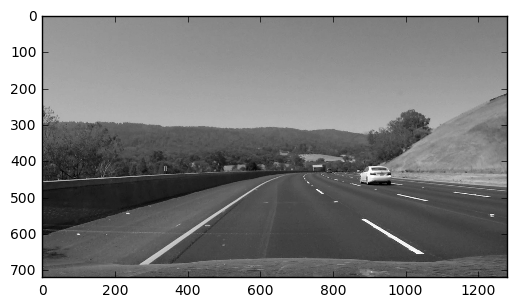

In [10]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray,cmap='gray')

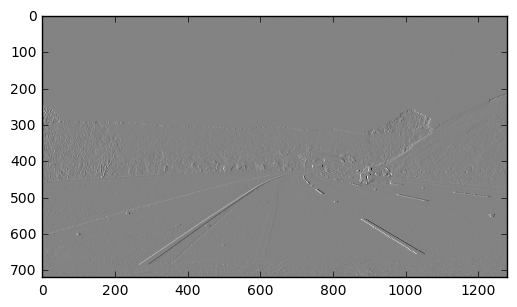

In [11]:
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
plt.imshow(sobelx,cmap='gray')

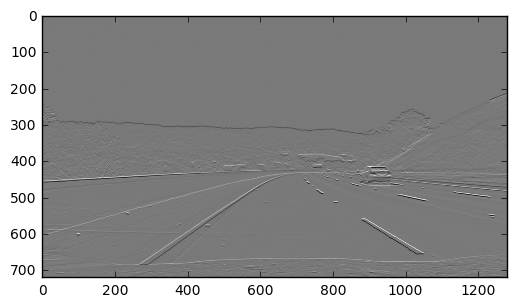

In [12]:
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
plt.imshow(sobely,cmap='gray')

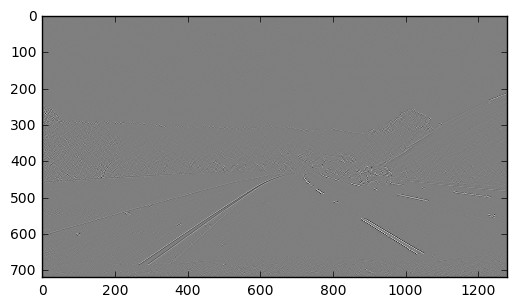

In [13]:
sobelxy = cv2.Sobel(gray, cv2.CV_64F, 1, 1)
plt.imshow(sobelxy,cmap='gray')

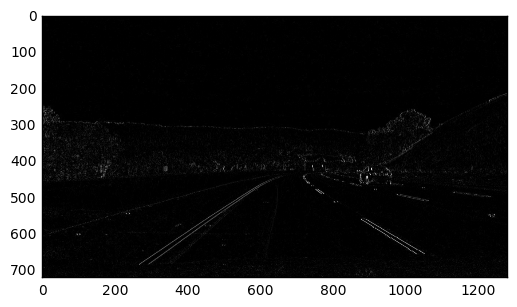

In [14]:
abs_sobelx = np.absolute(sobelx)
plt.imshow(abs_sobelx, cmap='gray')

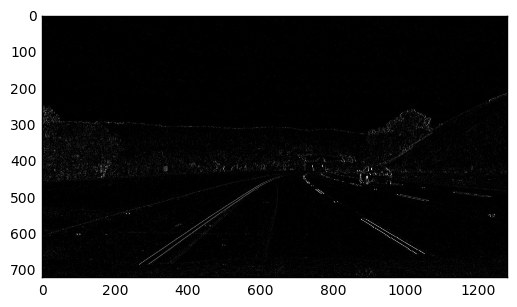

In [15]:
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
plt.imshow(scaled_sobel, cmap='gray')

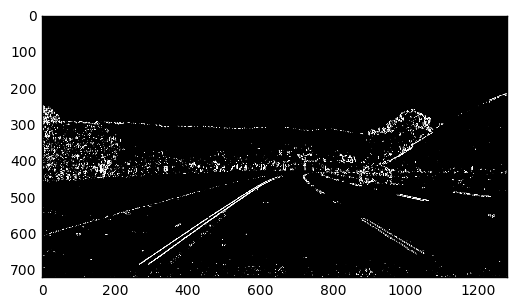

In [16]:
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)] = 1
plt.imshow(sxbinary,cmap='gray')

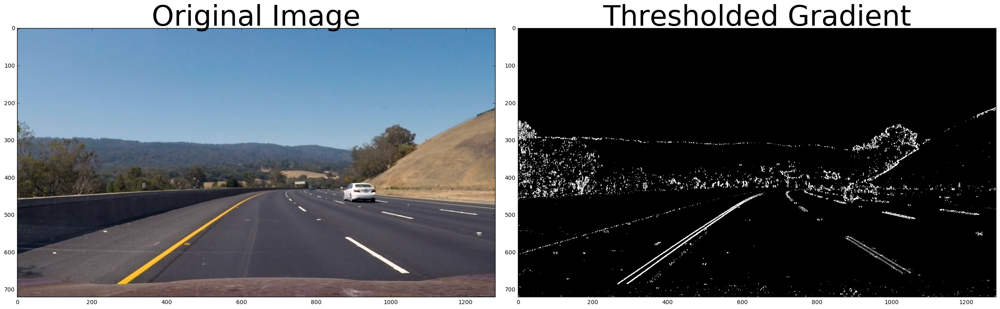

In [17]:

# Read in an image and grayscale it
#image = mpimg.imread('signs_vehicles_xygrad.png')
image = img
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient!='x':
        sobel_x = 0
        sobel_y = 1
    else:
        sobel_x = 1
        sobel_y = 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, sobel_x, sobel_y)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel>thresh_min)&(scaled_sobel<thresh_max)]=1
    # 6) Return this mask as your binary_output image

    return binary_output
    
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

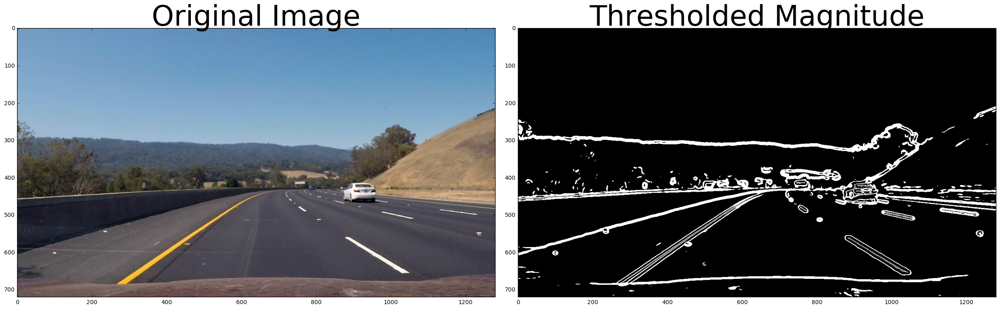

In [18]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = (sobelx**2+sobely**2)**0.5
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy>mag_thresh[0])&(scaled_sobelxy<mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=31, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

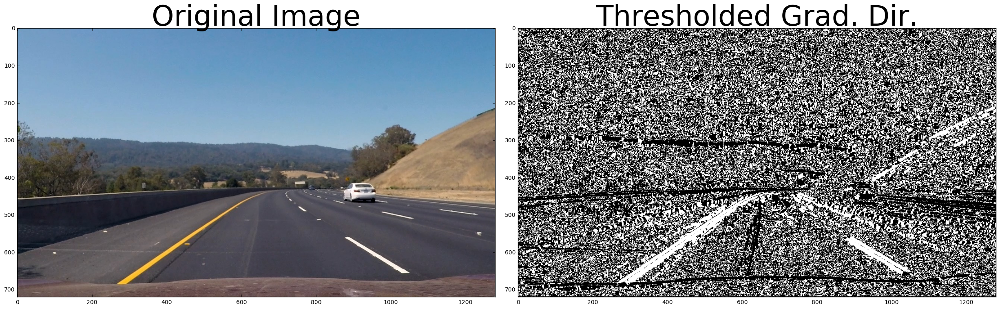

In [19]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    binary_output[(direction>thresh[0])&(direction<thresh[1])] = 1
    # 6) Return this mask as your binary_output image

    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

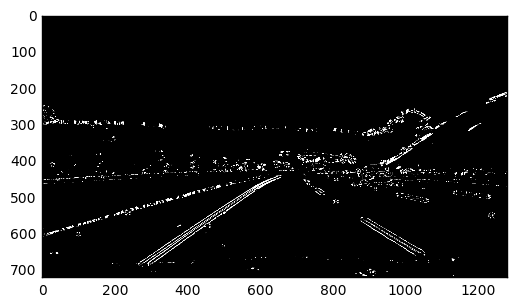

In [20]:
def grad_dir(img):
    mag_binary = mag_thresh(image, sobel_kernel=31, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    mag_dir = np.zeros_like(mag_binary)
    mag_dir = np.logical_and(mag_binary,dir_binary)
    return mag_dir
plt.imshow(grad_dir(image), cmap='gray')

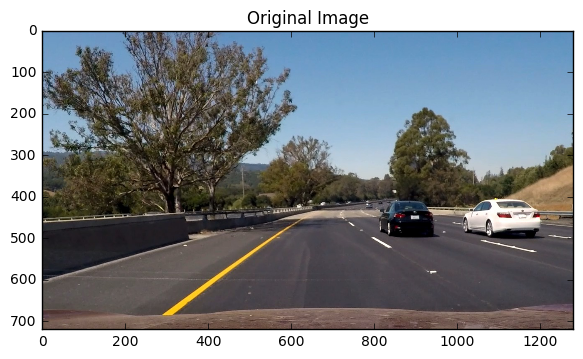

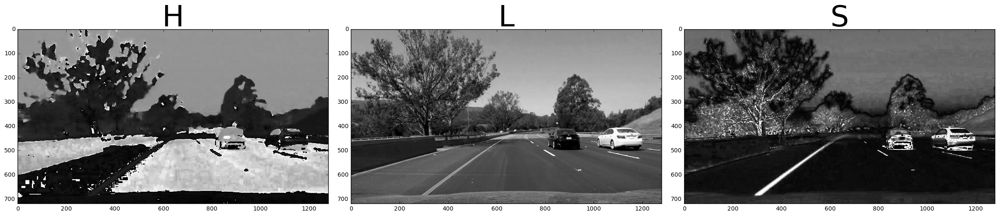

In [54]:
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/test6.jpg'
img_bgr = cv2.imread(fname)
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f, (ax1) = plt.subplots(1,1)
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image')
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(L, cmap='gray')
ax2.set_title('L', fontsize=50)
ax3.imshow(S, cmap='gray')
ax3.set_title('S', fontsize=50)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


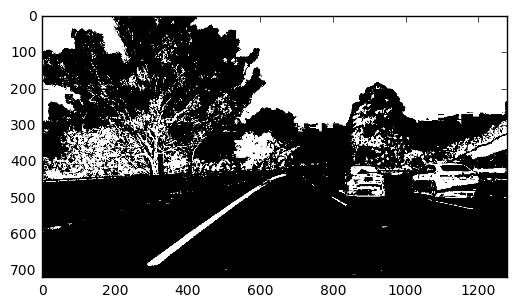

In [22]:
thresh = (80, 255)
binarys = np.zeros_like(S)
binarys[(S > thresh[0]) & (S <= thresh[1])] = 1
plt.imshow(binarys,cmap='gray')

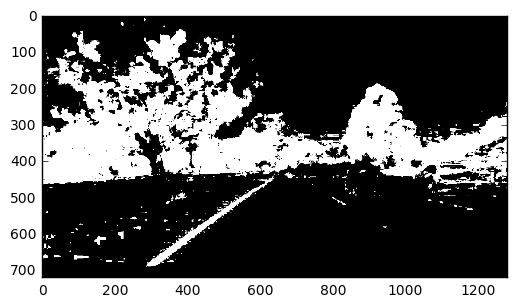

In [23]:
# binary hue
thresh = (15, 100)
binaryh = np.zeros_like(H)
binaryh[(H > thresh[0]) & (H <= thresh[1])] = 1
plt.imshow(binaryh,cmap='gray')

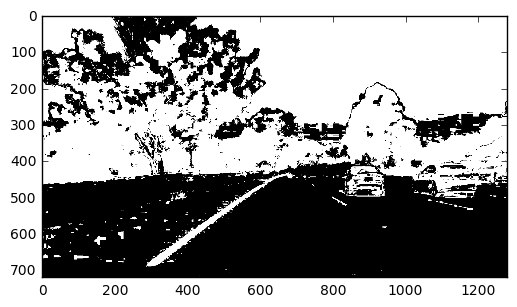

In [24]:
binaryhs = np.logical_or(binaryh,binarys)
plt.imshow(binaryhs,cmap='gray')

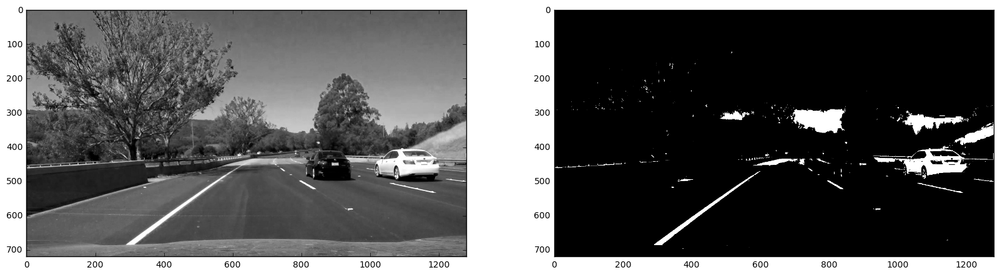

In [25]:
R = img[:,:,0]
thresh = (180,255)

binaryr = np.zeros_like(R)
binaryr[(R>thresh[0])&(R<=thresh[1])] = 1
f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))

ax1.imshow(R,cmap='gray')
ax2.imshow(binaryr,cmap='gray')

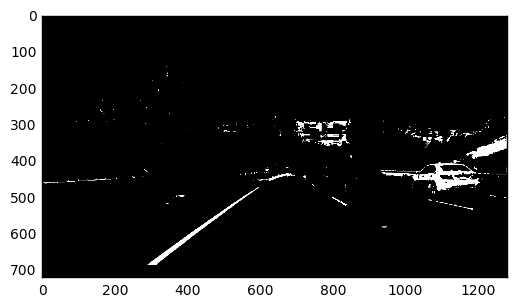

In [64]:
binaryhr = np.where(np.logical_and(binaryhs,binaryr)==True,1.,0.)
plt.imshow(binaryhr,cmap='gray')

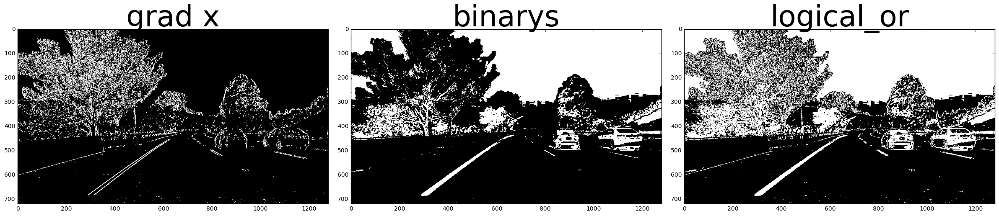

In [58]:
gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
binary_gradx_s = np.where(np.logical_or(gradx, binarys)==True,1.,0.)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('grad x', fontsize=50)
ax2.imshow(binarys, cmap='gray')
ax2.set_title('binarys', fontsize=50)
ax3.imshow(binary_gradx_s, cmap='gray')
ax3.set_title('logical_or', fontsize=50)


plt.imshow(binary_gradx_s,cmap='gray')

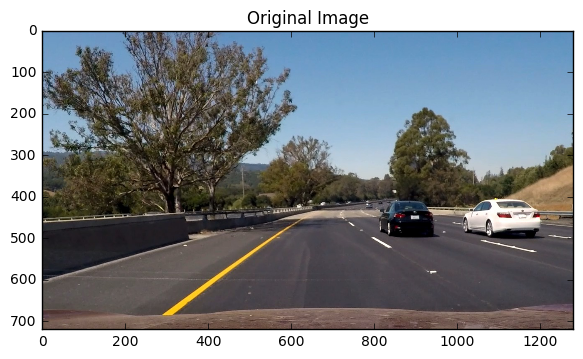

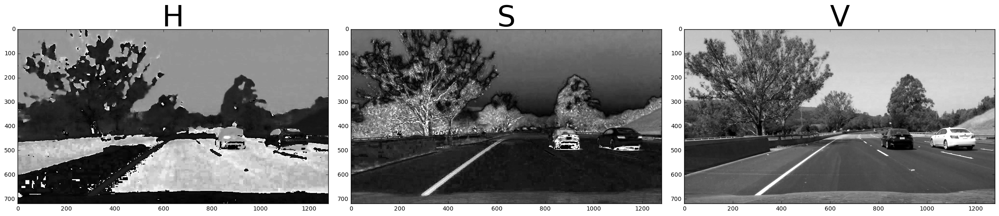

In [28]:
hsv = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
H_hsv = hsv[:,:,0]
S_hsv = hsv[:,:,1]
V_hsv = hsv[:,:,2]

f, (ax1) = plt.subplots(1,1)
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image')
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H_hsv, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(S_hsv, cmap='gray')
ax2.set_title('S', fontsize=50)
ax3.imshow(V_hsv, cmap='gray')
ax3.set_title('V', fontsize=50)

In [47]:
%matplotlib qt
fname = '/Users/olegair/Documents/MyNewCareer/SDCND/p4/CarND-Advanced-Lane-Lines/test_images/straight_lines2.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [30]:
img.shape

(720, 1280, 3)

In [32]:
temp = np.where(binary_gradx_s==True, 1.0, 0.0 )
temp

array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 0.,  1.,  0., ...,  1.,  1.,  1.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  1.,  1., ...,  0.,  1.,  0.]])

In [61]:
%matplotlib inline
def show_2gr(img1,img2):
    f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
    ax1.imshow(img1, cmap='gray')
    ax2.imshow(img2, cmap='gray')

In [173]:
def warp(img):
    w,h = img.shape[1],img.shape[0] 
    img_size=(w,h)
    y = 0.8*h
    #x = 3.7/18*y
    x=0.5*w
    src = np.float32([[434./1280*w,562./720*h],
                      [589./1280*w,453./720*h],
                      [694./1280*w,453./720*h],
                      [864./1280*w,562./720*h]])
    dst = np.float32([[(w-x)/2.,0.9*h],
                      [(w-x)/2.,0.1*h],
                      [(w+x)/2.,0.1*h],
                      [(w+x)/2.,0.9*h]])
    M = cv2.getPerspectiveTransform(src,dst)
    img_warp = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
  
    return img_warp

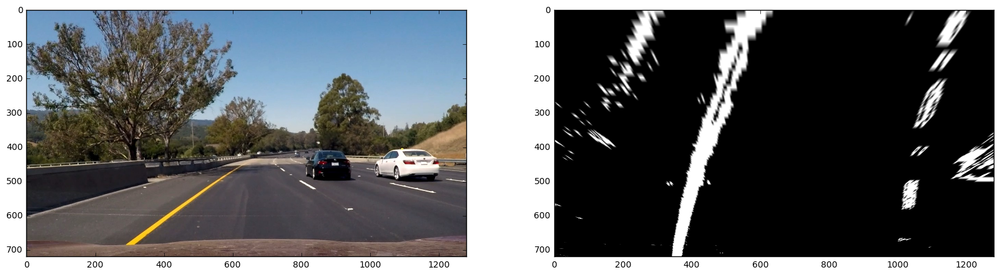

In [79]:
img_persp = persp_transf(binary_gradx_s)
show_2gr(img,img_persp)

//anaconda/envs/myPython3Environment/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


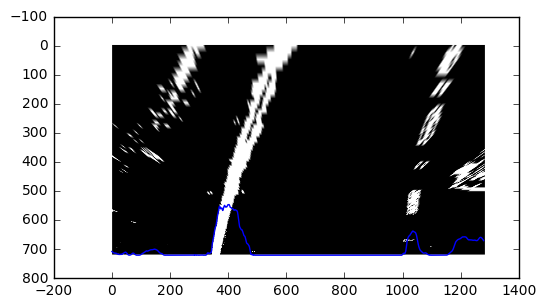

In [92]:
# histogram
def hist(img):
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    return histogram

histogram = hist(img_persp)
plt.imshow(img_persp,cmap='gray')
plt.plot(img.shape[0]-histogram)

In [89]:
m = int(len(histogram)/2)
print (np.argmax(histogram[:m]), m+np.argmax(histogram[m:]))

403 1036


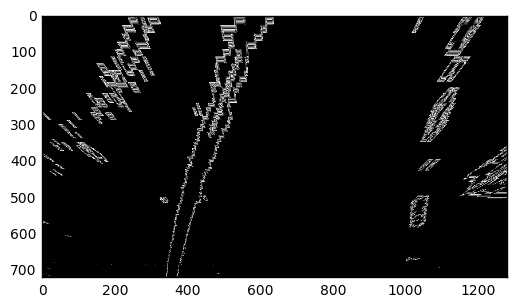

In [97]:
out_img = np.dstack((img_persp, img_persp, img_persp))*255
plt.imshow(out_img)

In [98]:
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

In [99]:
# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(img_persp.shape[0]/nwindows)

In [100]:
# Identify the x and y positions of all nonzero pixels in the image
nonzero = img_persp.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

In [101]:
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base

In [102]:
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

In [103]:
# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = img_persp.shape[0] - (window+1)*window_height
    win_y_high = img_persp.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
       # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))


In [104]:
# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

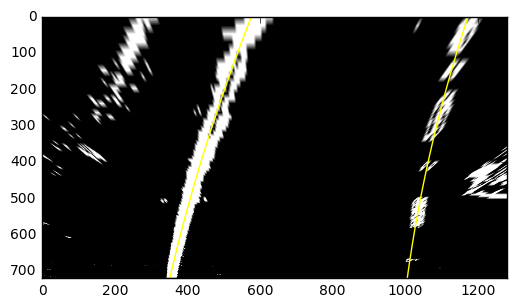

In [121]:
# Generate x and y values for plotting
ploty = np.linspace(0, img_persp.shape[0]-1, img_persp.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.imshow(out_img)
plt.imshow(img_persp,cmap='gray')
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)

plt.ylim(720, 0)

In [119]:

len(img_persp.nonzero()[0])

103398

In [116]:
img_persp.shape[0]*img_persp.shape[1]

921600

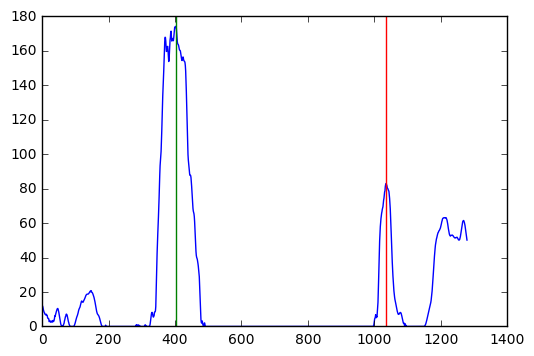

In [136]:
plt.plot(histogram)
mid_point = int(len(histogram)/2)
left = np.argmax(histogram[:mid_point])
right = np.argmax(histogram[mid_point:]) + mid_point
plt.plot((left,left),(0,180))
plt.plot((right,right), (0,180))

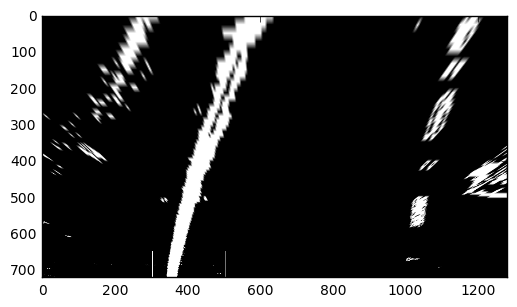

In [155]:
h = img_persp.shape[0]
w = img_persp.shape[1]
margin = 100
num_wind = 10
height = int(img_persp.shape[0] / num_wind)


work = img_persp*255.
cv2.rectangle(work, pt1=(left-margin,h),pt2=(left+margin,h-height),color=255,thickness=1,lineType=1)
plt.imshow(work,cmap='gray')

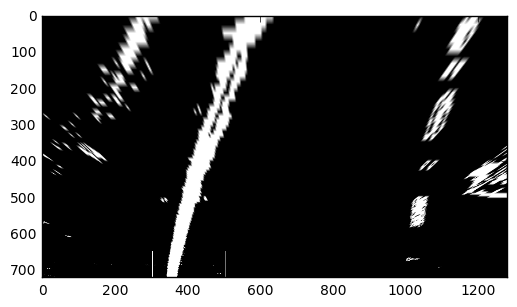

In [157]:
plt.imshow(img_persp,cmap='gray')